# Importações e Leitura

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as clu
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris
import plotly.express as px

In [2]:
df_Diabetes = pd.read_csv('../DiabetesDataSet/diabetes_012_health_indicators_BRFSS2015.csv',low_memory=False)
pd.set_option('display.max_columns', 200)

# Display do Dataset

In [3]:
display(df_Diabetes)

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,5.0,0.0,1.0,5.0,6.0,7.0
253676,2.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,5.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,7.0,5.0,1.0


In [4]:
df_Diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_012          253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

In [55]:
for column in df_Diabetes.columns:
    print(f"{column}: {df_Diabetes[column].unique()}")

Diabetes_012: [0. 2. 1.]
HighBP: [1. 0.]
HighChol: [1. 0.]
CholCheck: [1. 0.]
BMI: [40. 25. 28. 27. 24. 30. 34. 26. 33. 21. 23. 22. 38. 32. 37. 31. 29. 20.
 35. 45. 39. 19. 47. 18. 36. 43. 55. 49. 42. 17. 16. 41. 44. 50. 59. 48.
 52. 46. 54. 57. 53. 14. 15. 51. 58. 63. 61. 56. 74. 62. 64. 66. 73. 85.
 60. 67. 65. 70. 82. 79. 92. 68. 72. 88. 96. 13. 81. 71. 75. 12. 77. 69.
 76. 87. 89. 84. 95. 98. 91. 86. 83. 80. 90. 78.]
Smoker: [1. 0.]
Stroke: [0. 1.]
HeartDiseaseorAttack: [0. 1.]
PhysActivity: [0. 1.]
Fruits: [0. 1.]
Veggies: [1. 0.]
HvyAlcoholConsump: [0. 1.]
AnyHealthcare: [1. 0.]
NoDocbcCost: [0. 1.]
GenHlth: [5. 3. 2. 4. 1.]
MentHlth: [18.  0. 30.  3.  5. 15. 10.  6. 20.  2. 25.  1.  4.  7.  8. 21. 14. 26.
 29. 16. 28. 11. 12. 24. 17. 13. 27. 19. 22.  9. 23.]
PhysHlth: [15.  0. 30.  2. 14. 28.  7. 20.  3. 10.  1.  5. 17.  4. 19.  6. 12. 25.
 27. 21. 22.  8. 29. 24.  9. 16. 18. 23. 13. 26. 11.]
DiffWalk: [1. 0.]
Sex: [0. 1.]
Age: [ 9.  7. 11. 10.  8. 13.  4.  6.  2. 12.  5.  1.  3

# Removendo Duplicatas

In [5]:
print(df_Diabetes.duplicated().sum())

23899


In [6]:
df_Diabetes = df_Diabetes.drop_duplicates()

In [8]:
display(df_Diabetes)

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,5.0,0.0,1.0,5.0,6.0,7.0
253676,2.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,5.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,7.0,5.0,1.0


# Verificando Nulos

In [54]:
print(df_cleaned.isnull().sum())

Diabetes_012            0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64


# Identificando e tratando outliers

In [ ]:
Foram encontrados outliers significativos nas colunas de BMI e GenHlth.

## BMI 

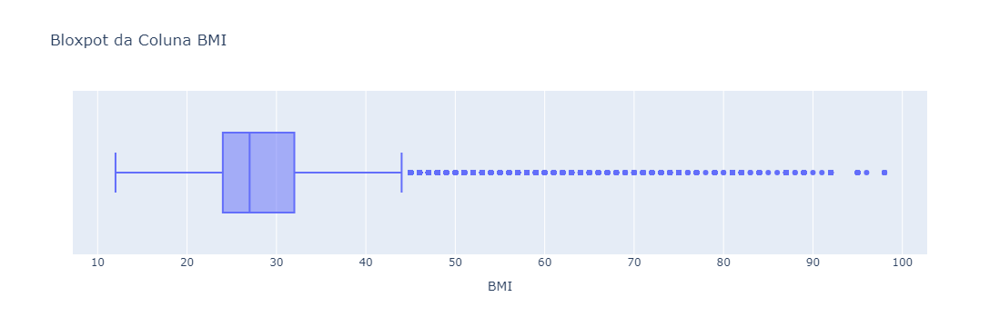

In [11]:
fig = px.box(df_Diabetes, x='BMI', title='Bloxpot da Coluna BMI')
fig.show()

In [68]:
Q1 = df_Diabetes['BMI'].quantile(0.25)
Q3 = df_Diabetes['BMI'].quantile(0.75)
IQR = Q3 - Q1

# Definir limites para detectar outliers
lower_bound = Q1 - 1.0 * IQR
upper_bound = Q3 + 1.0 * IQR

# Filtrar outliers
outliers = df_Diabetes[(df_Diabetes['BMI'] < lower_bound) | (df_Diabetes['BMI'] > upper_bound)]
print("Outliers:")
print(outliers)

# Remover outliers
df_cleaned = df_Diabetes[~((df_Diabetes['BMI'] < lower_bound) | (df_Diabetes['BMI'] > upper_bound))]

Outliers:
        Diabetes_012  HighBP  HighChol  CholCheck   BMI  Smoker  Stroke  \
85               2.0     1.0       1.0        1.0  45.0     0.0     0.0   
97               0.0     1.0       0.0        1.0  45.0     0.0     0.0   
156              2.0     1.0       1.0        1.0  47.0     1.0     0.0   
188              0.0     1.0       0.0        1.0  43.0     1.0     0.0   
201              2.0     1.0       1.0        1.0  55.0     0.0     0.0   
...              ...     ...       ...        ...   ...     ...     ...   
253547           0.0     1.0       1.0        1.0  44.0     0.0     0.0   
253557           0.0     1.0       1.0        1.0  42.0     0.0     0.0   
253567           0.0     1.0       1.0        1.0  44.0     0.0     0.0   
253673           0.0     1.0       0.0        1.0  42.0     0.0     0.0   
253675           0.0     1.0       1.0        1.0  45.0     0.0     0.0   

        HeartDiseaseorAttack  PhysActivity  Fruits  Veggies  \
85                       0

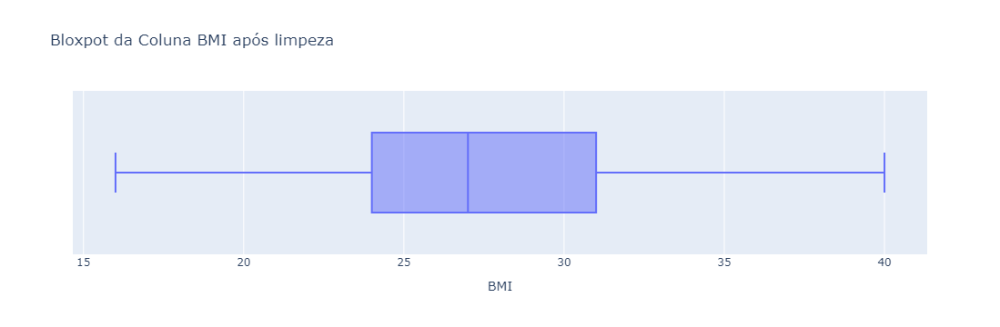

In [56]:
fig = px.box(df_cleaned, x='BMI', title='Bloxpot da Coluna BMI após limpeza')
fig.show()

## GenHlth

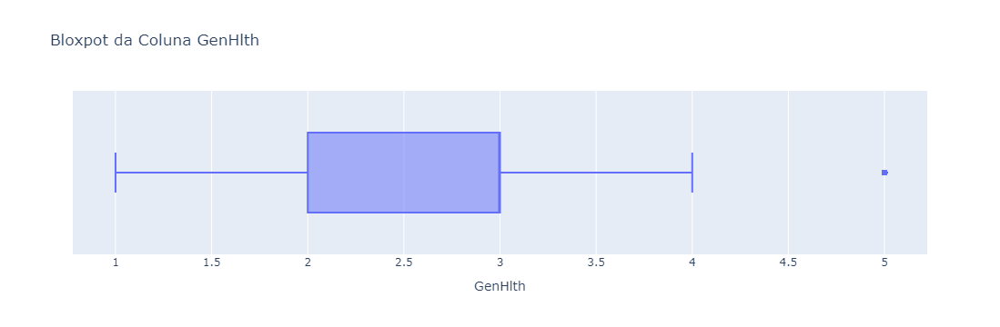

In [57]:
fig = px.box(df_Diabetes, x='GenHlth', title='Bloxpot da Coluna GenHlth')
fig.show()

In [70]:
Q1 = df_Diabetes['GenHlth'].quantile(0.25)
Q3 = df_Diabetes['GenHlth'].quantile(0.75)
IQR = Q3 - Q1

# Definir limites para detectar outliers
upper_bound = Q3 + 1.0 * IQR

# Filtrar outliers
outliers = df_Diabetes[(df_Diabetes['GenHlth'] > upper_bound)]
print("Outliers:")
print(outliers)

# Remover outliers
df_cleaned =df_cleaned[~(df_cleaned['GenHlth'] > upper_bound)]

Outliers:
        Diabetes_012  HighBP  HighChol  CholCheck   BMI  Smoker  Stroke  \
0                0.0     1.0       1.0        1.0  40.0     1.0     0.0   
2                0.0     1.0       1.0        1.0  28.0     0.0     0.0   
8                2.0     1.0       1.0        1.0  30.0     1.0     0.0   
21               0.0     1.0       1.0        1.0  38.0     1.0     0.0   
26               2.0     1.0       1.0        1.0  37.0     1.0     1.0   
...              ...     ...       ...        ...   ...     ...     ...   
253601           0.0     1.0       1.0        1.0  19.0     0.0     0.0   
253609           0.0     1.0       0.0        1.0  35.0     0.0     0.0   
253612           2.0     1.0       1.0        1.0  30.0     0.0     0.0   
253626           0.0     0.0       0.0        1.0  29.0     0.0     0.0   
253670           2.0     1.0       1.0        1.0  25.0     0.0     0.0   

        HeartDiseaseorAttack  PhysActivity  Fruits  Veggies  \
0                        0

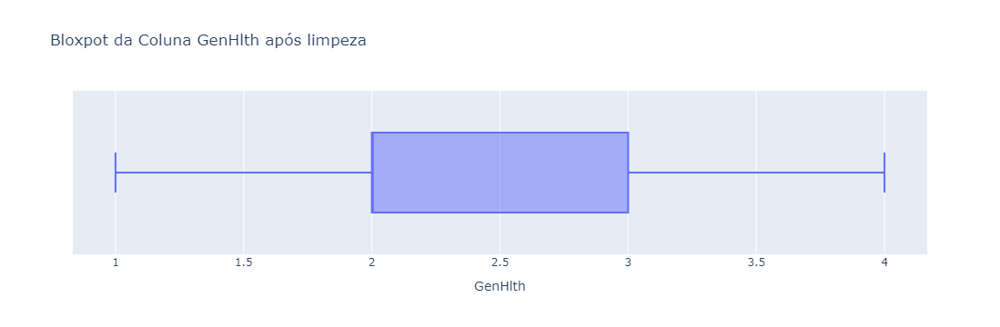

In [72]:
fig = px.box(df_cleaned, x='GenHlth', title='Bloxpot da Coluna GenHlth após limpeza')
fig.show()